# Data Augmentation for Pokemon Dataset

In [1]:
from time import time
import os
import tensorflow as tf
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline 
start_time = time()

In [2]:
def plotImages(images_arr):
    fig, axes = plt.subplots(4, 8, figsize=(80,50))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    #plt.tight_layout()
    plt.show()

In [3]:
gen = ImageDataGenerator( shear_range=0.15, zoom_range=0.1, horizontal_flip=True, rotation_range=20, brightness_range=[0.98,1.0], channel_shift_range=0.5)
#width_shift_range=0.1, height_shift_range=0.1,

## Testing Data Augmentation with a Pokemon

We want to see how our augmented pokemons are being generating, so we decided to show the results of this first example.

In [4]:
example = 'Pokemon_Dataset/abra.png'

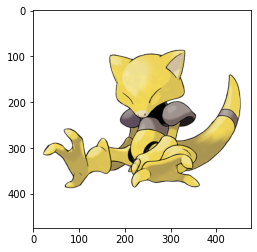

In [5]:
exampleImage = np.expand_dims(plt.imread(example),0)
plt.imshow(exampleImage[0])

In [6]:
augmentationSample = gen.flow(exampleImage)

In [7]:
print(augmentationSample)

In [8]:
aug_images = [next(augmentationSample)[0].astype("uint8") for i in range(32)]

In [9]:
def generateImg(img,savePrefix):
    exampleImage = np.expand_dims(plt.imread(img),0)
    augmentationSample = gen.flow(exampleImage,save_to_dir='dataset', save_prefix=savePrefix, save_format='png')
    aug_images = [next(augmentationSample)[0].astype("uint8") for i in range(32)]
    return aug_images

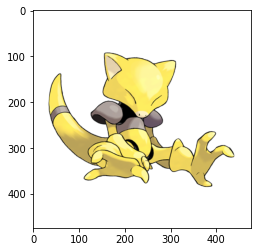

In [10]:
 plt.imshow(aug_images[0])

In [11]:
aug_images[0].shape

(475, 475, 4)

In [12]:
exampleImage.shape

(1, 475, 475, 4)

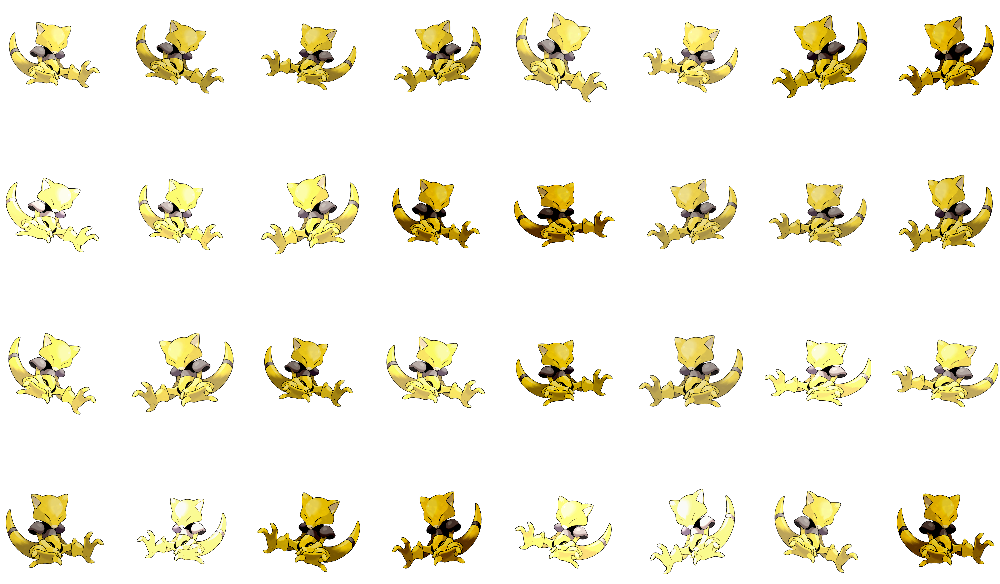

In [13]:
plotImages(aug_images)

## Generating our complete dataset for the project
Now we have defined the parameters that we are going to be using, we are ready to generete our complete dataset. For the 898 original pokemons (pokedex database). Finally we will get 898/32 (defualt batch size of ImgGen) = 28 pokemons in each epoh, so 28 x 898 = 25144. GANS usually needs at least 30.000 images.

In [14]:
imgs = os.listdir('Pokemon_Dataset')

In [15]:
len(imgs)

898

In [16]:
def showImgs(images_arr):
    fig, axes = plt.subplots(5, 10, figsize=(80,50))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        exampleImage = np.expand_dims(plt.imread("Pokemon_Dataset/"+img),0)
        ax.imshow(exampleImage[0])
        ax.axis('off')
    #plt.tight_layout()
    plt.show()

Exploring our pokemons

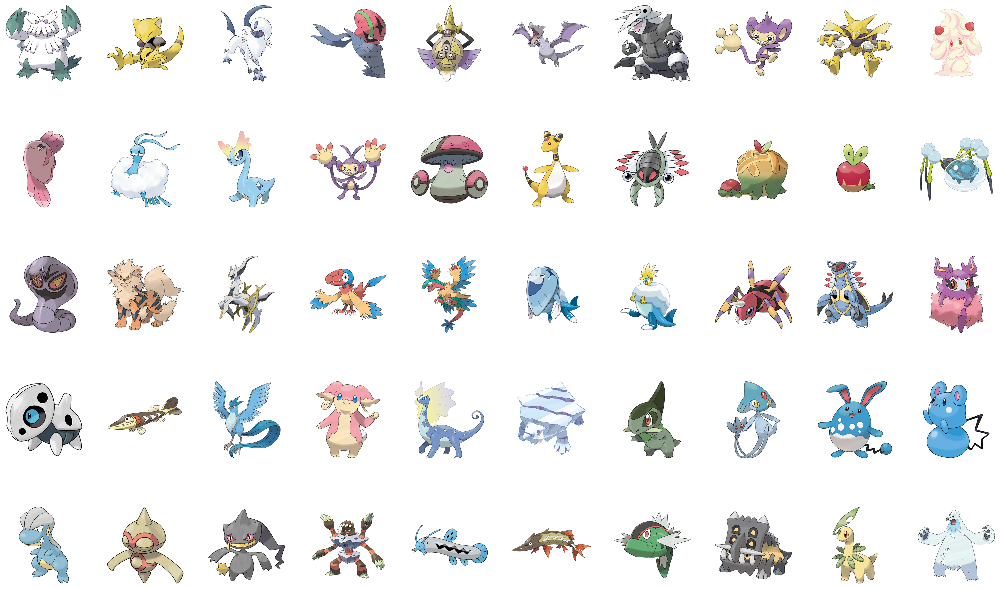

In [17]:
showImgs(imgs)

In [18]:
for i in range(300):
    img = "Pokemon_Dataset/"+imgs[i]
    aug_images = generateImg(img, 'DAG1')
    #plotImages(aug_images)

In [19]:
for i in range(301,600):
    img = "Pokemon_Dataset/"+imgs[i]
    aug_images = generateImg(img, 'DAG2')
    #plotImages(aug_images)

In [20]:
for i in range(601,898):
    img = "Pokemon_Dataset/"+imgs[i]
    aug_images = generateImg(img, 'DAG3')
    #plotImages(aug_images)

#### The estimated time to complete the data generation is:

In [21]:
elapsed_time = time() - start_time
print("Elapsed time: %.10f seconds." % elapsed_time)

Elapsed time: 5650.7442426682 seconds.


## Image data generator Bug

We didnt know that the Img Gen has a bug that cant save more than 10K images, so we were pushed to use new funtion to generate our complete dataset in three phases.
https://github.com/keras-team/keras/issues/7396